In [61]:
import pandas as pd

In [62]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [63]:
common_path = '/content/drive/MyDrive/CSCI6965test/Raw/'
path_bwa001 = common_path + 'bwa001-rwl-noaa.csv'
path_cmr001 = common_path + 'cmr001-rwl-noaa.csv'
path_cmr002 = common_path + 'cmr002-rwl-noaa.csv'
path_eth001 = common_path + 'eth001-rwl-noaa.csv'
path_eth002 = common_path + 'eth002-rwl-noaa.csv'
path_eth003 = common_path + 'eth003-rwl-noaa.csv'
path_eth004 = common_path + 'eth004-rwl-noaa.csv'
path_eth005 = common_path + 'eth005-rwl-noaa.csv'
path_rsa001 = common_path + 'rsa001-rwl-noaa.csv'
path_tza001 = common_path + 'tza001-rwl-noaa.csv'
path_zim001 = common_path + 'zim001-rwl-noaa.csv'
path_zim002 = common_path + 'zim002-rwl-noaa.csv'
path_zim003 = common_path + 'zim003-rwl-noaa.csv'

In [64]:
raw_files = [path_bwa001, path_cmr001, path_cmr002, path_eth001, path_eth002, path_eth003, path_eth004, path_eth005, path_rsa001, path_tza001, path_zim001, path_zim002, path_zim003]

In [65]:
print("Number of Files :", len(raw_files))

Number of Files : 13


In [66]:
for items in raw_files :
  print("File-path : ", items)

File-path :  /content/drive/MyDrive/CSCI6965test/Raw/bwa001-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/cmr001-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/cmr002-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/eth001-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/eth002-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/eth003-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/eth004-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/eth005-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/rsa001-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/tza001-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/zim001-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/zim002-rwl-noaa.csv
File-path :  /content/drive/MyDrive/CSCI6965test/Raw/zim003-rwl-noaa.csv


In [67]:
def read_csv(file) :
  dataframe = pd.read_csv(file)
  return dataframe

In [68]:
def remove_nan(dataframe) :
  dataframe_remove_nan = dataframe.fillna(0)
  return dataframe_remove_nan

In [69]:
def columns_to_normalize(dataframe) :
  columns_to_normalize = dataframe.columns.difference(['age_CE'])
  return columns_to_normalize

In [70]:
def normalization_function(column) :
  min_val = column.min()
  max_val = column.max()
  nor_val = (column - min_val) / (max_val - min_val)
  return nor_val

In [71]:
def normalize(filename) :

  # Read CSV
  dataframe = read_csv(filename)

  # Replace NaN values with 0
  df_no_nan = remove_nan(dataframe)

  # Determine what columns to normalize
  columns_to_normalize = df_no_nan.columns.difference(['age_CE'])

  # Normalize
  normalized_df = df_no_nan.copy()
  normalized_df[columns_to_normalize] = normalized_df[columns_to_normalize].apply(normalization_function, axis=0)

  # Back to NaN values
  normalized_df = normalized_df.where(dataframe.notna())

  # Export the CSV with Normalized dataframe
  filename = filename.replace('/content/drive/MyDrive/CSCI6965test/Raw/', "")
  exported_filepath = '/content/drive/MyDrive/CSCI6965test/Normalized/normalized-'+filename
  normalized_df.to_csv(exported_filepath, index=False)

  return normalized_df

In [74]:
import matplotlib.pyplot as plt

def plot_values(dataframe) :

  x_values = dataframe['age_CE']
  y_values = dataframe.drop('age_CE', axis=1)

  plt.figure(figsize=(20, 8))

  for column in y_values.columns:
      plt.plot(x_values, y_values[column], label=column, marker='.')

  plt.xlabel('Year CE')
  plt.ylabel('Values')
  plt.title('Tree Ring width data')
  plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1))
  plt.xticks(range(min(x_values), max(x_values)+1, 25))

  plt.grid(True)
  plt.show()

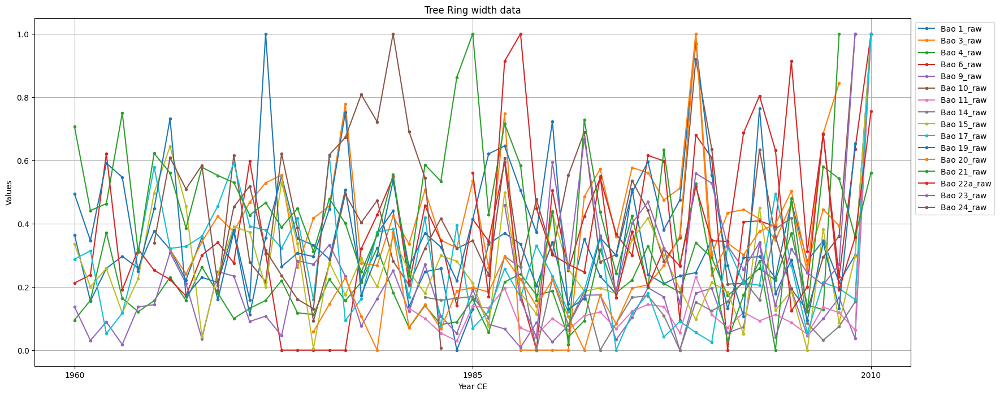

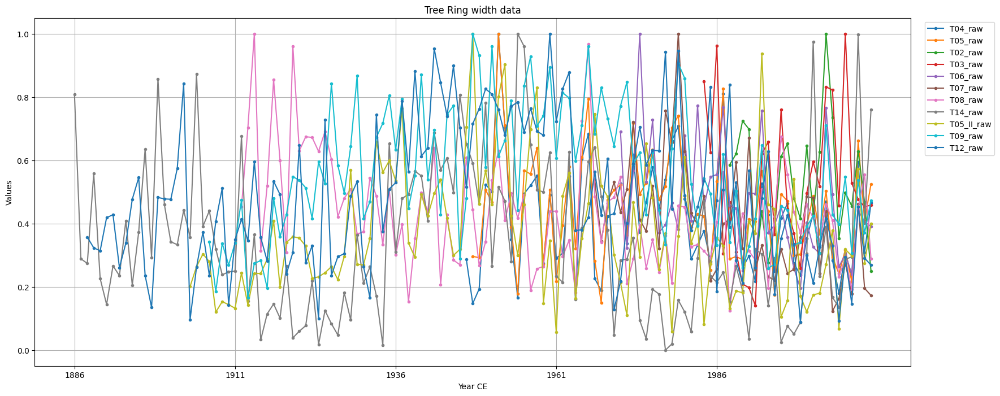

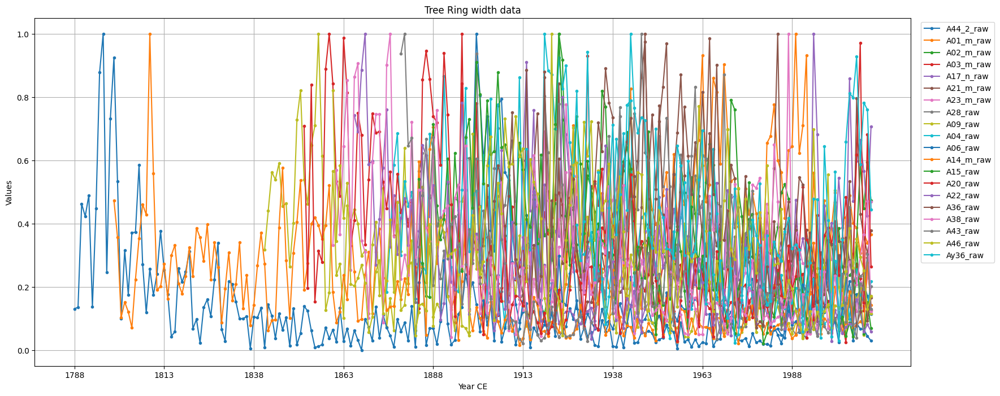

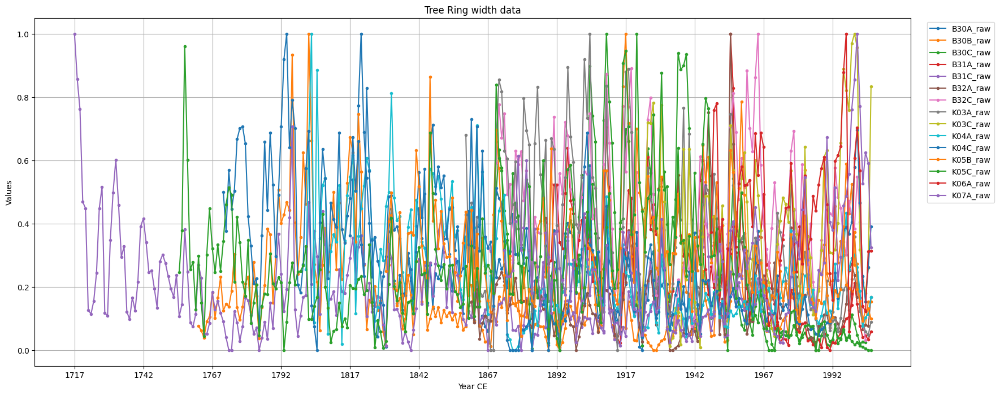

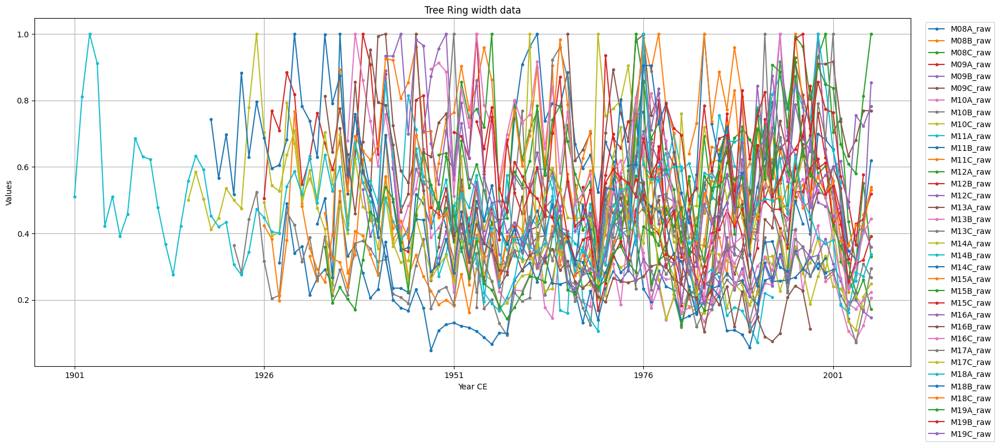

...

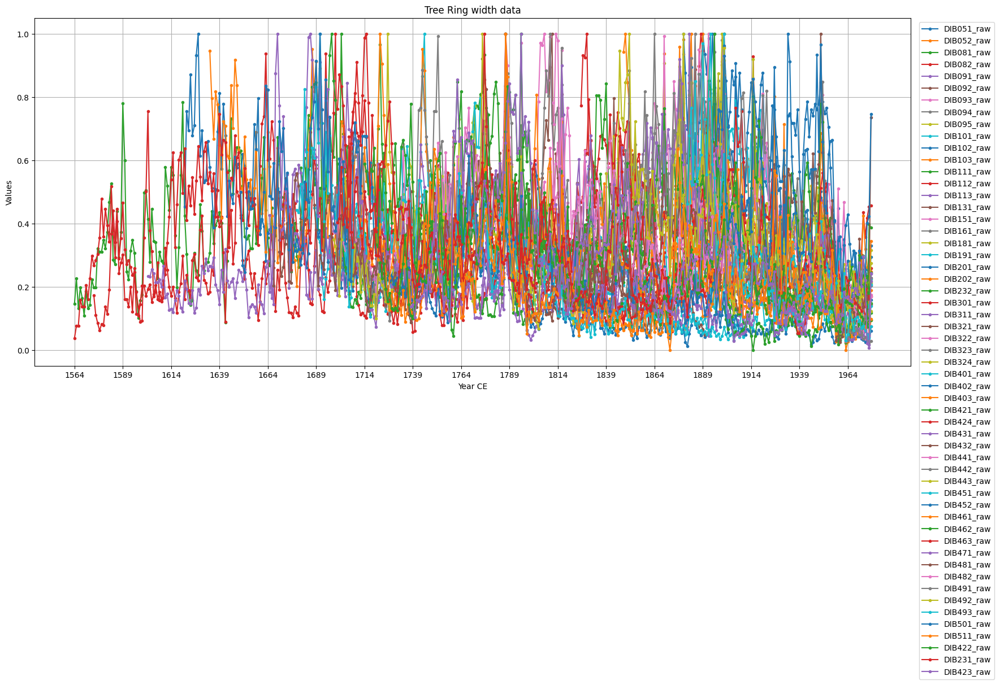

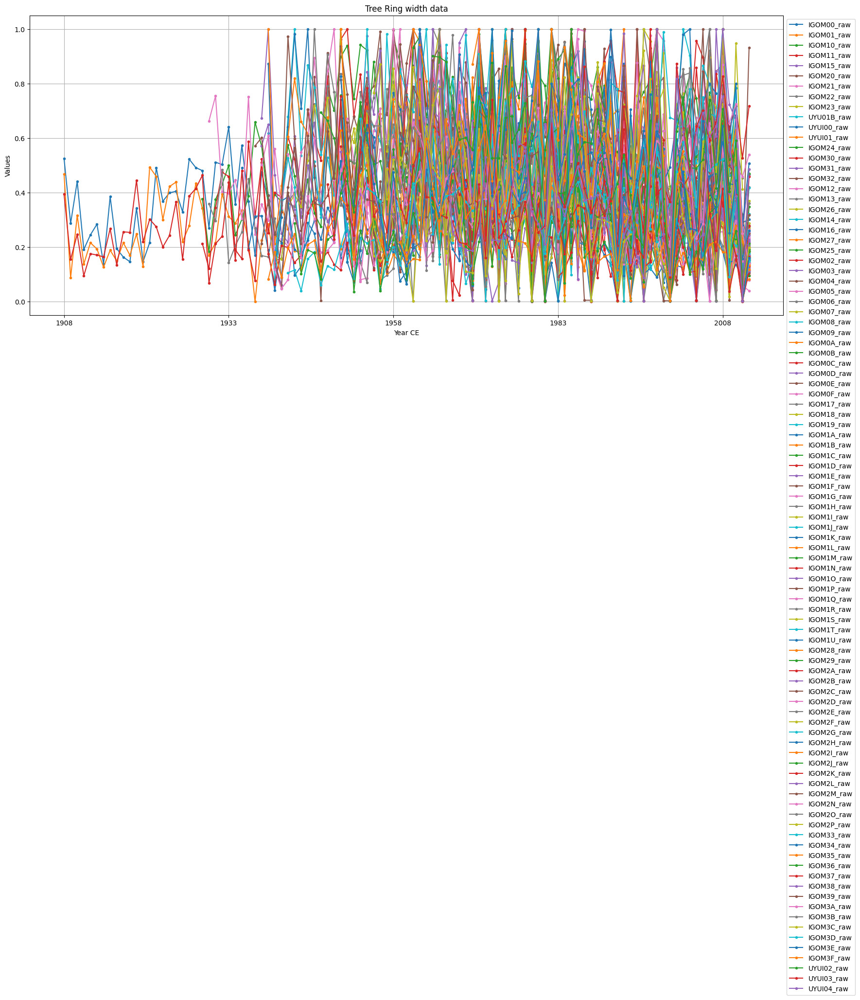

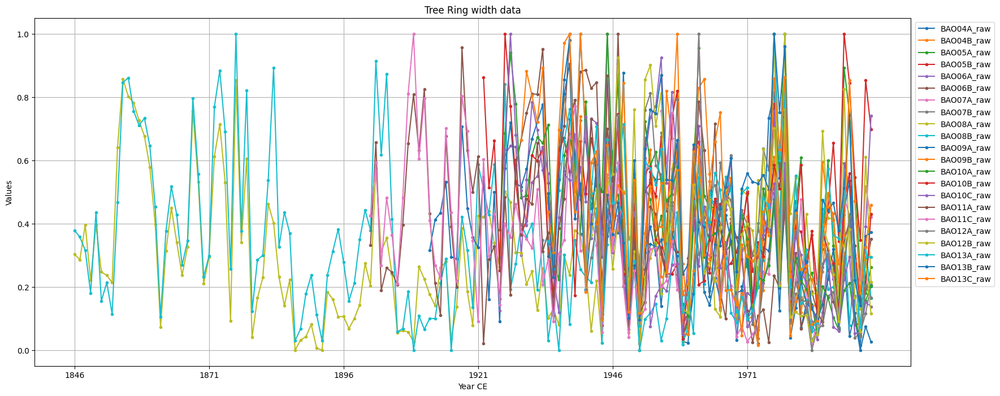

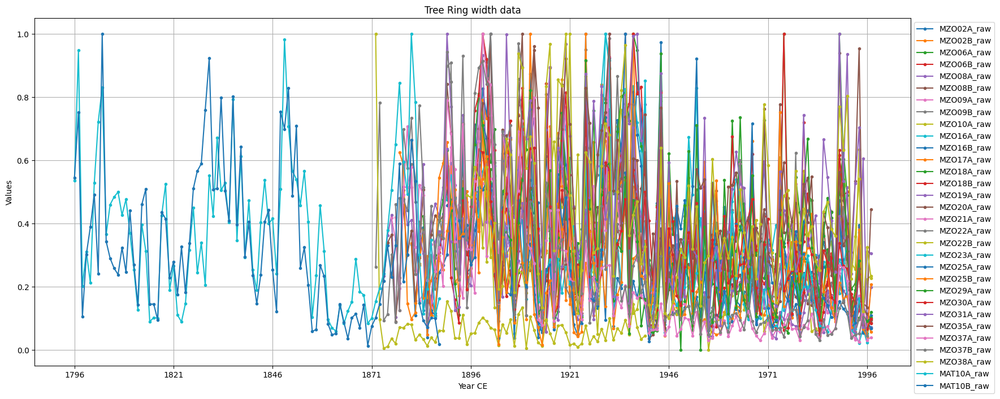

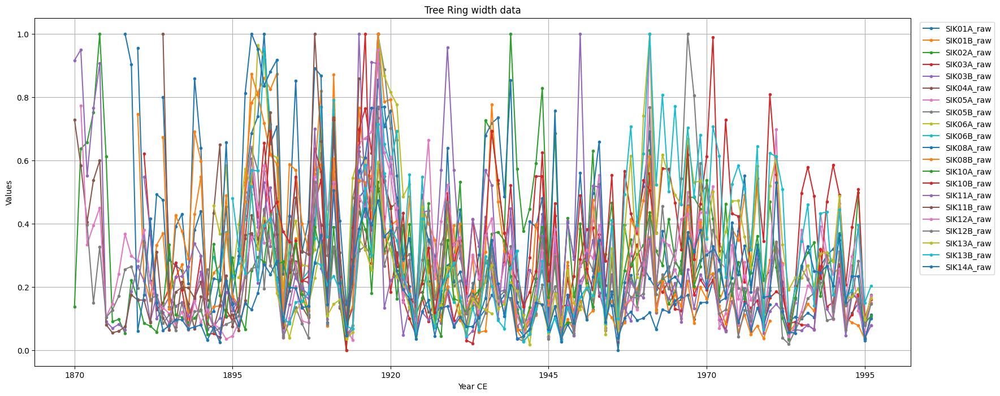

In [75]:
for items in raw_files :
  normalized_dataframe = normalize(items)
  plot_values(normalized_dataframe)